### PSF Investigation

In [1]:
from astropy.table import Table
import glob
import lsst.afw.table as afwTable
import matplotlib as mpl
import matplotlib.pyplot as plt
from modelling_research.plotting import plotjoint_running_percentiles
import numpy as np
import os
import pandas as pd
import re
import seaborn as sns

savepre = '/home/dtaranu/raid/lsst/w2019_02_coaddpsf'
savepost = '.parq'
bands = ['HSC-' + x for x in ['G','R','I']]
files = {
    band: glob.glob('/datasets/hsc/repo/rerun/RC/w_2019_02/DM-16110/'
                    'deepCoadd-results/{}/*/*/meas*'.format(band))
    for band in bands
}
filesl5 = {
    band: glob.glob('/datasets/hsc/repo/rerun/private/yusra/RC2/w_2019_06_lanczos5/'
                    'deepCoadd-results/{}/*/*/meas*'.format(band))
    for band in bands
}

In [2]:
%matplotlib inline
sns.set_style('darkgrid')
mpl.rcParams['figure.dpi'] = 240
mpl.rcParams['image.origin'] = 'lower'
sns.set(rc={'axes.facecolor': '0.85', 'figure.facecolor': 'w'})

In [3]:
def make_summary(file):
    try:
        src = afwTable.BaseCatalog.readFits(file)
    except:
        return None
    print(file)
    mask = np.logical_and.reduce((
        src.get('calib_psf_used')==1,
        src.get('base_PixelFlags_flag_interpolated')==False,
        src.get('base_PixelFlags_flag_saturated')==False,
        src.get('base_PixelFlags_flag_inexact_psf')==False,
        src.get('base_PixelFlags_flag_clipped')==False
    ))
    if np.sum(mask)==0:
        print('No data')
        return None
    sIxxKey = src.schema.find('base_SdssShape_xx').key
    sIyyKey = src.schema.find('base_SdssShape_yy').key
    sIxyKey = src.schema.find('base_SdssShape_xy').key
    mIxxKey = src.schema.find('base_SdssShape_psf_xx').key
    mIyyKey = src.schema.find('base_SdssShape_psf_yy').key
    mIxyKey = src.schema.find('base_SdssShape_psf_xy').key
    fluxPsfKey = src.schema.find('base_PsfFlux_instFlux').key
    fluxPsfErrKey = src.schema.find('base_PsfFlux_instFluxErr').key
    fluxCmodelKey = src.schema.find('modelfit_CModel_instFlux').key
    fluxCmodelErrKey = src.schema.find('modelfit_CModel_instFluxErr').key
    stars = src[mask]
    starIxx = src.get(sIxxKey)[mask]
    starIxy = src.get(sIxyKey)[mask]
    starIyy = src.get(sIyyKey)[mask]
    modelIxx = src.get(mIxxKey)[mask]
    modelIxy = src.get(mIxyKey)[mask]
    modelIyy = src.get(mIyyKey)[mask]
    data = {}
    data['starE1'] = (starIxx-starIyy)/(starIxx+starIyy)
    data['starE2'] = (2*starIxy)/(starIxx+starIyy)
    data['starSize'] = np.sqrt(0.5*(starIxx + starIyy))*2.354820045*0.168
    data['modelE1'] = (modelIxx-modelIyy)/(modelIxx+modelIyy)
    data['modelE2'] = (2*modelIxy)/(modelIxx+modelIyy)
    data['modelSize'] = np.sqrt(0.5*(modelIxx + modelIyy))*2.354820045*0.168
    data['ra'] = [a.getCoord().getRa().asDegrees() for a in stars]
    data['dec'] = [a.getCoord().getDec().asDegrees() for a in stars]
    data['fluxPsf'] = src.get(fluxPsfKey)[mask]
    data['fluxPsfErr'] = src.get(fluxPsfErrKey)[mask]
    data['fluxCmodel'] = src.get(fluxCmodelKey)[mask]
    data['fluxCmodelErr'] = src.get(fluxCmodelErrKey)[mask]
    data['file'] = file
    #data['visit'] = visit
    df = pd.DataFrame(data)
    return df

def make_parquet(filesin, fileout):
    data=[]
    for f in filesin:
        result = make_summary(f)
        if result is None:
            continue
        data.append(result)
    warp = pd.concat(data)
    warp.to_parquet(fileout)
    return warp

In [4]:
data = {}
datal5 = {}
for band in bands:
    for datadict, filestoread, desc in [(data, files, ''), (datal5, filesl5, 'l5')]:
        savefile = ('_' + band).join([savepre, desc + savepost])
        print(savefile)
        if not os.path.exists(savefile):
            datadict[band] = make_parquet(filestoread[band], savefile)
        else:
            datadict[band] = pd.read_parquet(savefile)

/home/dtaranu/raid/lsst/w2019_02_coaddpsf_HSC-G.parq
/home/dtaranu/raid/lsst/w2019_02_coaddpsf_HSC-Gl5.parq
/home/dtaranu/raid/lsst/w2019_02_coaddpsf_HSC-R.parq
/home/dtaranu/raid/lsst/w2019_02_coaddpsf_HSC-Rl5.parq
/home/dtaranu/raid/lsst/w2019_02_coaddpsf_HSC-I.parq
/home/dtaranu/raid/lsst/w2019_02_coaddpsf_HSC-Il5.parq


/software/lsstsw/stack_20190330/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/pandas/core/computation/expressions.py:183: UserWarning: evaluating in Python space because the '*' operator is not supported by numexpr for the bool dtype, use '&' instead
  .format(op=op_str, alt_op=unsupported[op_str]))


HSC-G Lanczos3, 0.521 <= FWHM <= 0.621, N=2843
HSC-G Lanczos3, 0.621 <= FWHM <= 0.637, N=2843
HSC-G Lanczos3, 0.637 <= FWHM <= 0.648, N=2843
HSC-G Lanczos3, 0.648 <= FWHM <= 0.656, N=2843
HSC-G Lanczos3, 0.656 <= FWHM <= 0.667, N=2843
HSC-G Lanczos3, 0.667 <= FWHM <= 0.695, N=2842
HSC-G Lanczos3, 0.695 <= FWHM <= 0.768, N=2843
HSC-G Lanczos3, 0.768 <= FWHM <= 0.802, N=2843
HSC-G Lanczos3, 0.802 <= FWHM <= 0.843, N=2843
HSC-G Lanczos3, 0.843 <= FWHM <= 1.868, N=2843
HSC-R Lanczos3, 0.393 <= FWHM <= 0.458, N=4338
HSC-R Lanczos3, 0.458 <= FWHM <= 0.469, N=4337
HSC-R Lanczos3, 0.469 <= FWHM <= 0.478, N=4338
HSC-R Lanczos3, 0.478 <= FWHM <= 0.486, N=4338
HSC-R Lanczos3, 0.486 <= FWHM <= 0.496, N=4338


/software/lsstsw/stack_20190330/python/miniconda3-4.5.12/envs/lsst-scipipe/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


HSC-R Lanczos3, 0.496 <= FWHM <= 0.520, N=4337
HSC-R Lanczos3, 0.520 <= FWHM <= 0.573, N=4338
HSC-R Lanczos3, 0.573 <= FWHM <= 0.600, N=4338
HSC-R Lanczos3, 0.600 <= FWHM <= 0.624, N=4337
HSC-R Lanczos3, 0.624 <= FWHM <= 0.896, N=4338
HSC-I Lanczos3, 0.386 <= FWHM <= 0.456, N=3727
HSC-I Lanczos3, 0.456 <= FWHM <= 0.465, N=3727
HSC-I Lanczos3, 0.465 <= FWHM <= 0.476, N=3727
HSC-I Lanczos3, 0.476 <= FWHM <= 0.493, N=3727
HSC-I Lanczos3, 0.493 <= FWHM <= 0.509, N=3727
HSC-I Lanczos3, 0.509 <= FWHM <= 0.525, N=3726
HSC-I Lanczos3, 0.525 <= FWHM <= 0.537, N=3727
HSC-I Lanczos3, 0.537 <= FWHM <= 0.549, N=3727
HSC-I Lanczos3, 0.549 <= FWHM <= 0.574, N=3727
HSC-I Lanczos3, 0.574 <= FWHM <= 0.915, N=3727
HSC-G Lanczos5, 0.525 <= FWHM <= 0.623, N=2904
HSC-G Lanczos5, 0.623 <= FWHM <= 0.639, N=2904
HSC-G Lanczos5, 0.639 <= FWHM <= 0.650, N=2905
HSC-G Lanczos5, 0.650 <= FWHM <= 0.658, N=2904
HSC-G Lanczos5, 0.658 <= FWHM <= 0.669, N=2904
HSC-G Lanczos5, 0.669 <= FWHM <= 0.700, N=2904
HSC-G Lanczos

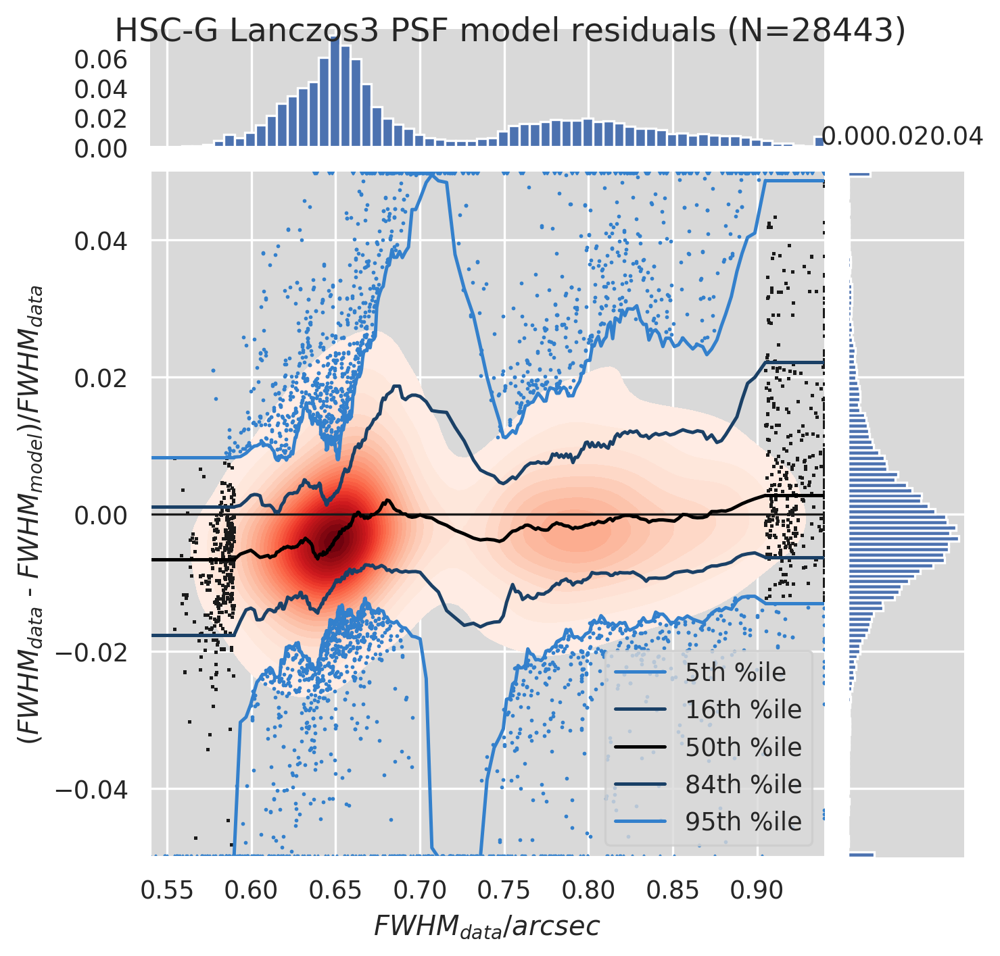

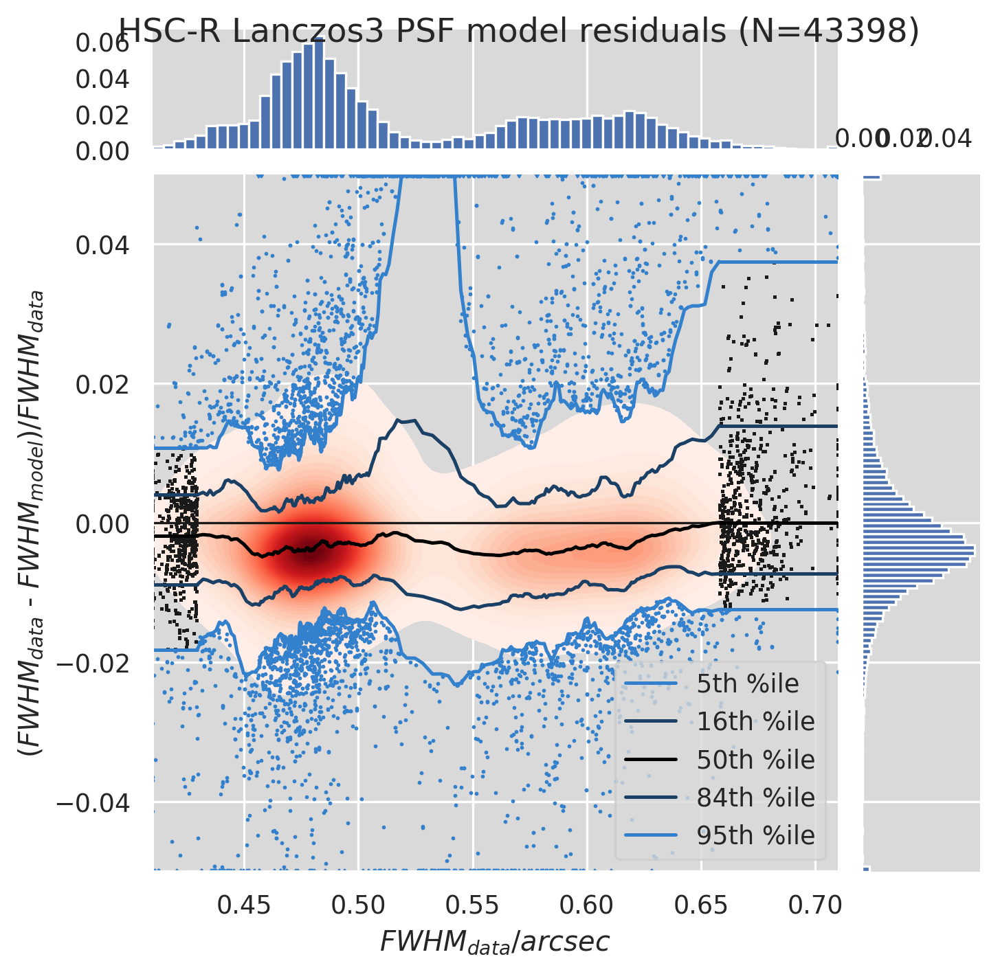

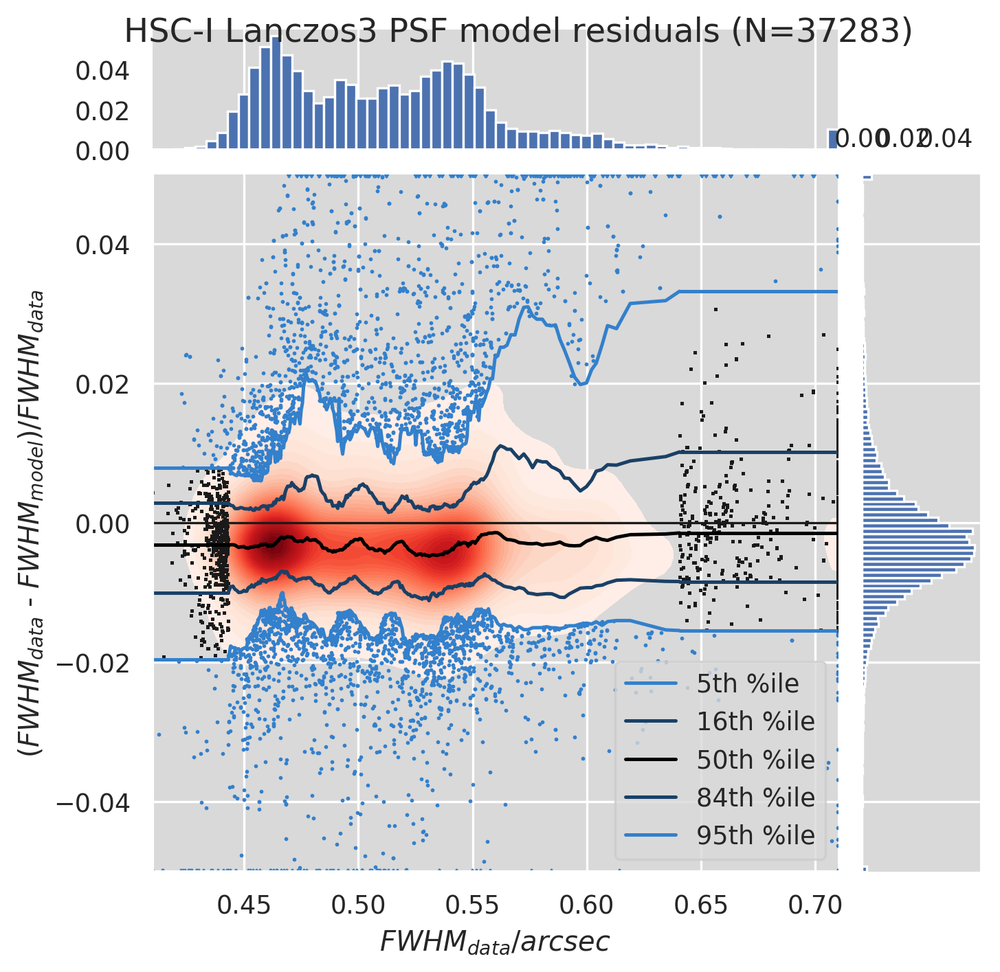

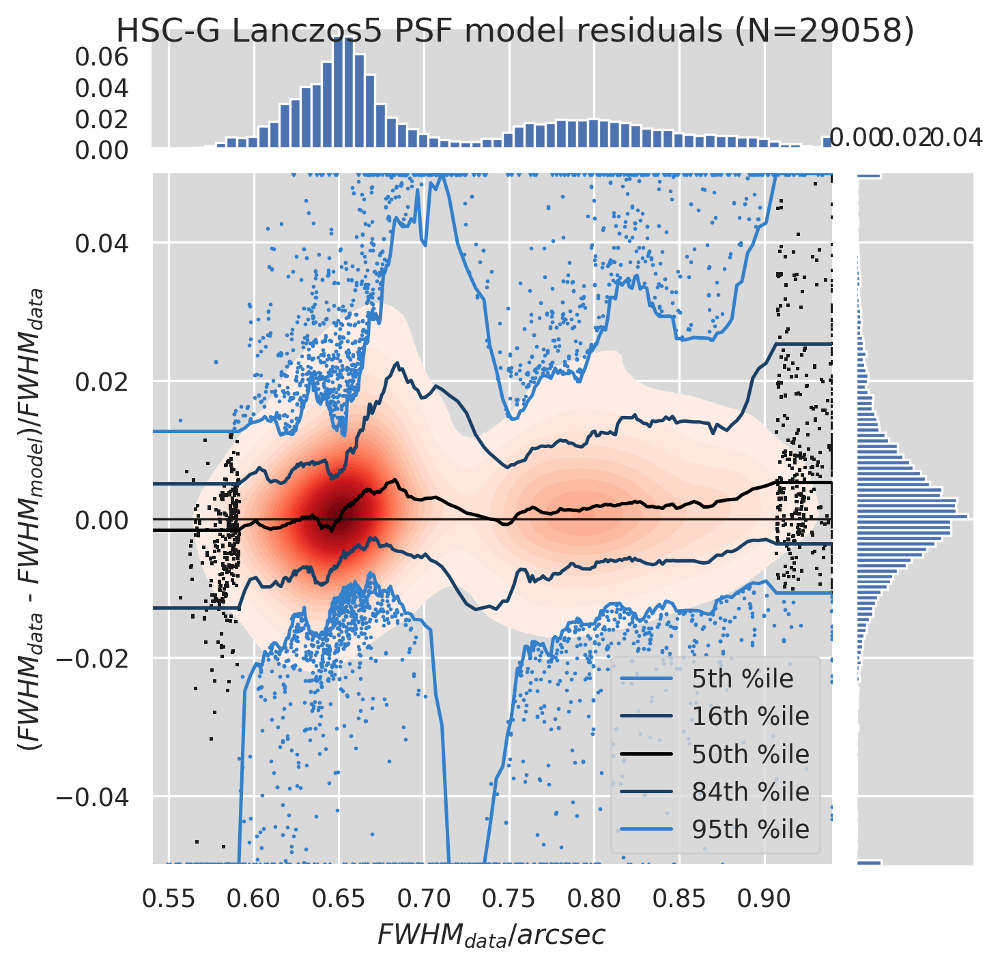

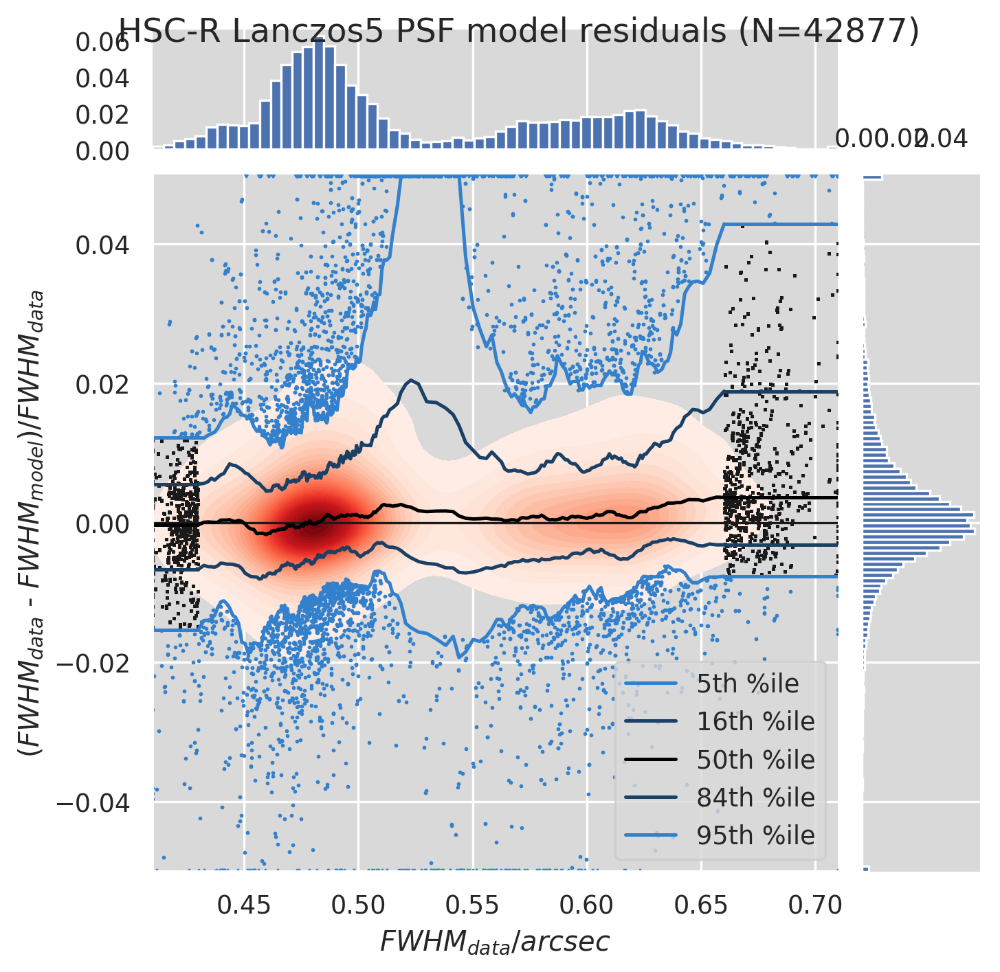

...

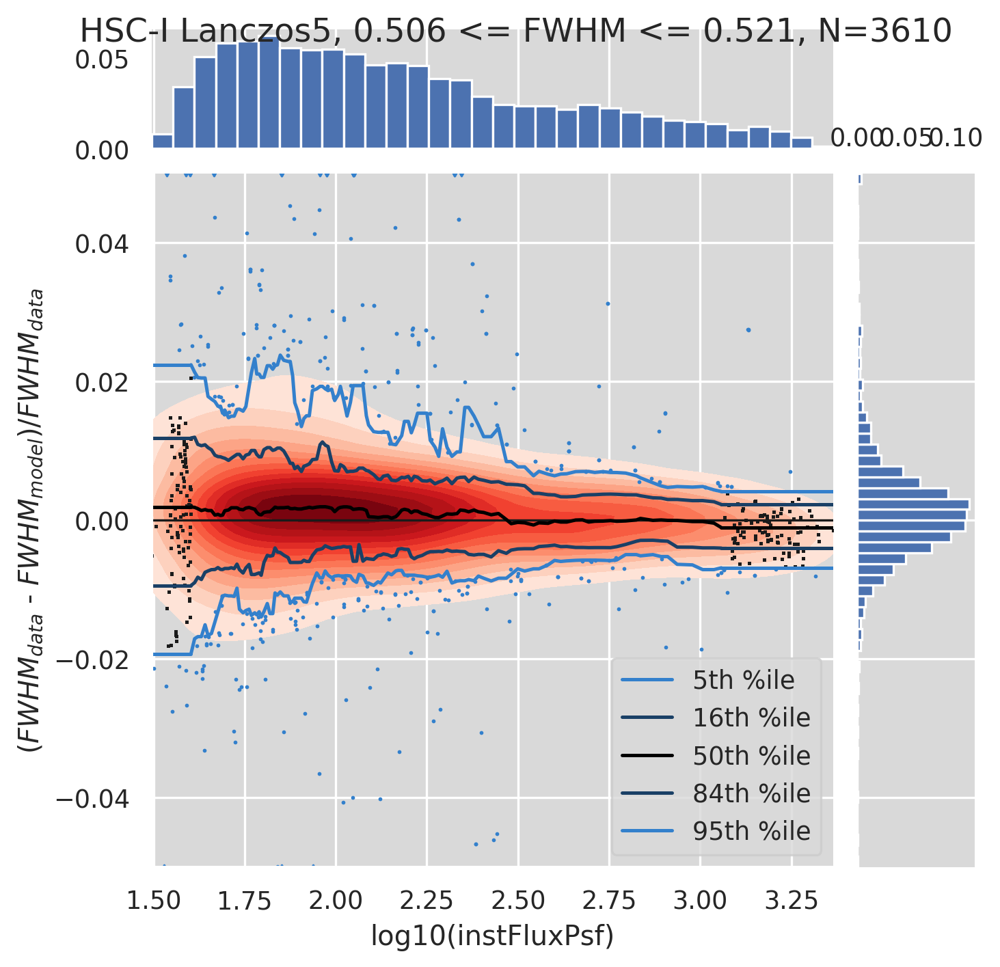

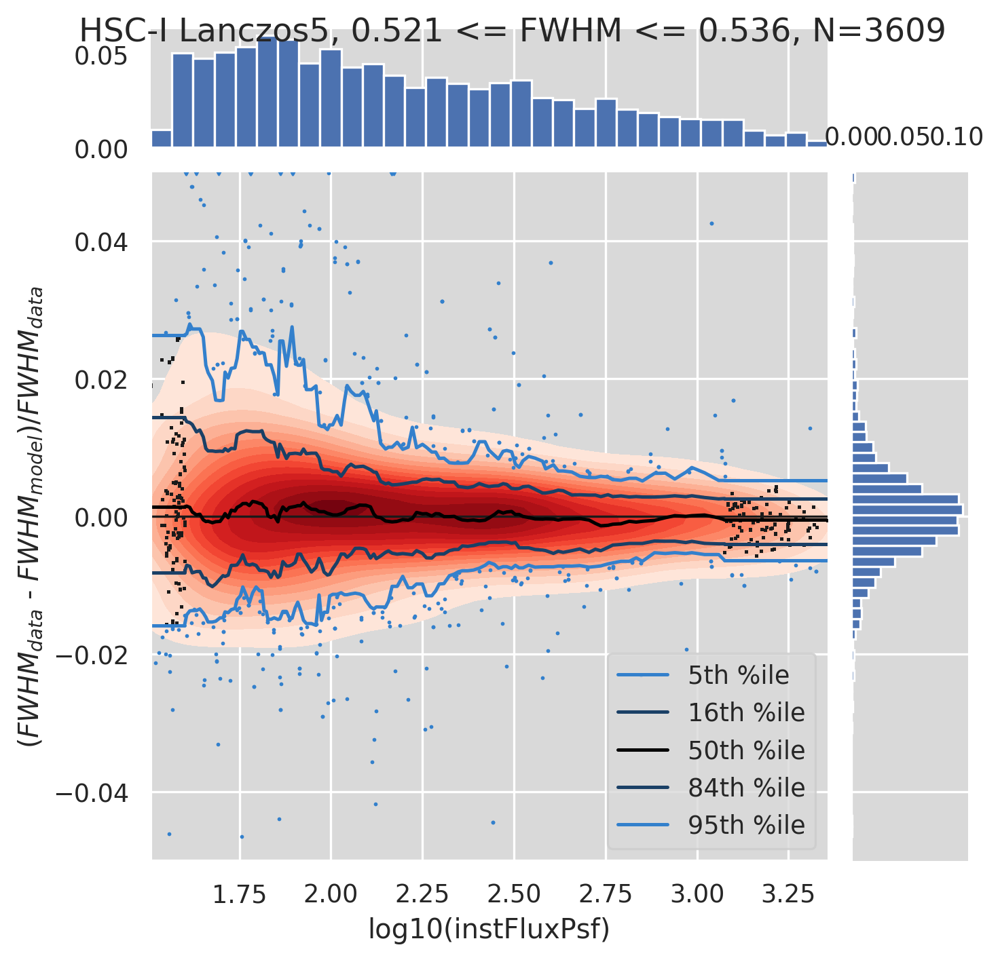

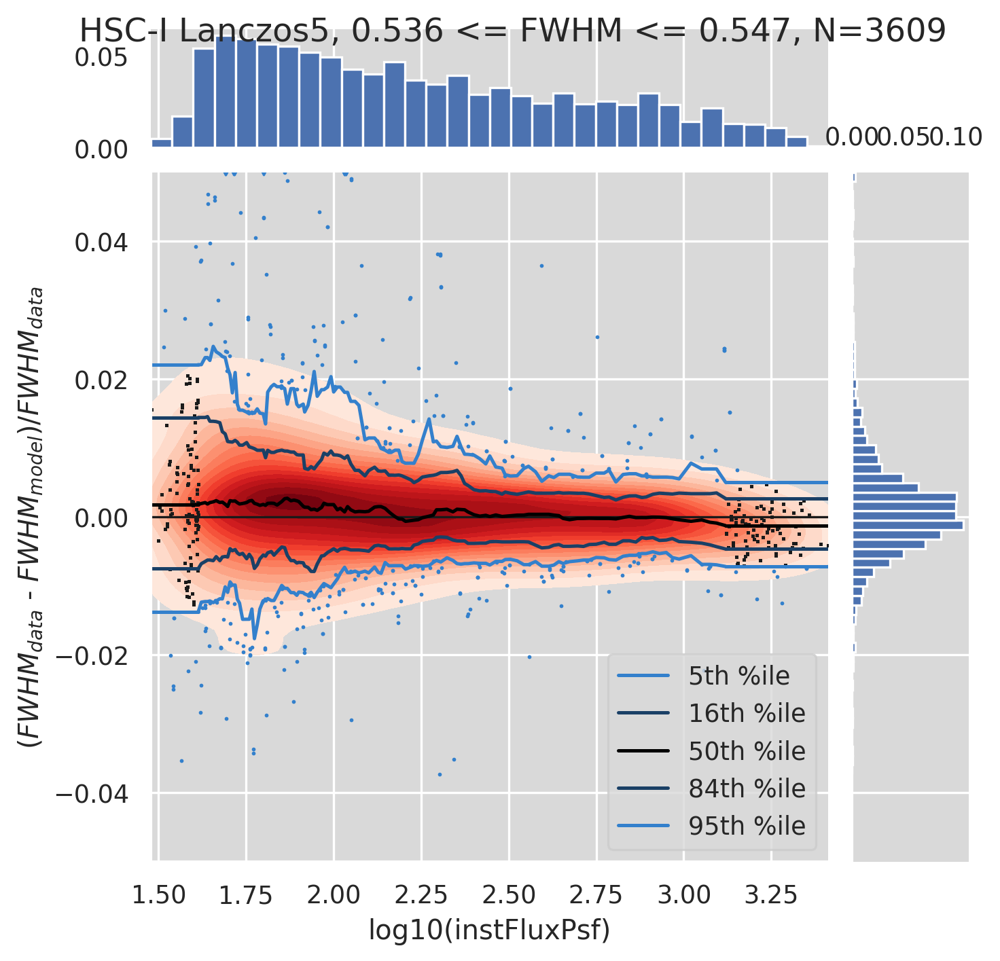

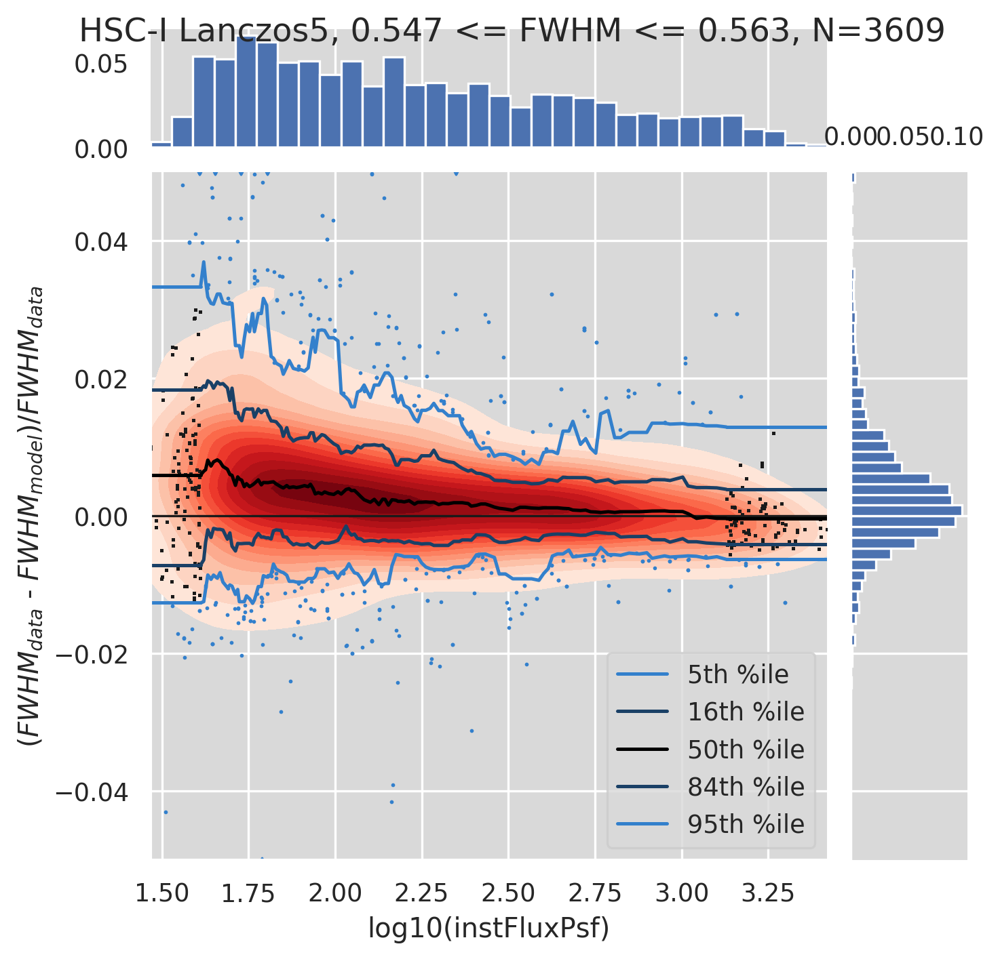

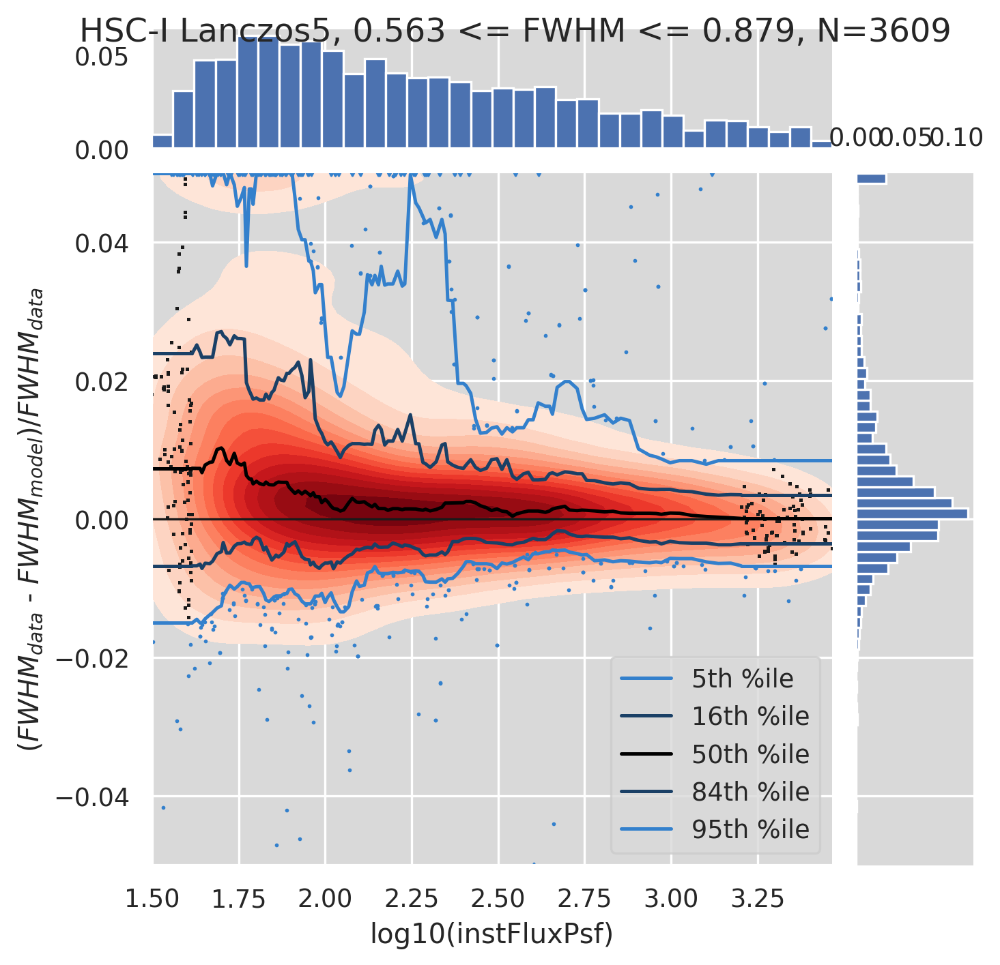

In [5]:
nbinspan = 8
limsfrac = (-0.05, 0.05)
tickshist=np.linspace(0, 1, 101)
bandsplot = bands
doonlyoneplot = False
if doonlyoneplot:
    bandsplot = ['HSC-I']
labelflux = 'log10(instFluxPsf)'
labelsizeresid = r'($FWHM_{data}$ - $FWHM_{model}$)/$FWHM_{data}$'
labelsize = r'$FWHM_{data}/arcsec$'
limxs = {
    'HSC-G': (0.54, 0.94),
    'HSC-R': (0.41, 0.71),
    'HSC-I': (0.41, 0.71),
}
for dataplot, typeofdata in [(data, 'Lanczos3'), (datal5, 'Lanczos5')]:
    for band in bandsplot:
        datum = dataplot[band]
        limx = limxs[band]
        x = np.clip(datum['starSize'], limx[0], limx[1])
        sizefrac = (datum['starSize']-datum['modelSize'])/datum['starSize']
        title='{} {} PSF model residuals (N={})'.format(band, typeofdata, len(x))
        plotjoint_running_percentiles(x, sizefrac, limx=limx, limy=limsfrac, ndivisions=32, nbinspan=nbinspan, labelx=labelsize, labely=labelsizeresid,
                                       title=title, histtickspacingxmaj=0.02, histtickspacingymaj=0.02, scatterleft=True, scatterright=True)

for dataplot, typeofdata in [(data, 'Lanczos3'), (datal5, 'Lanczos5')]:
    for band in bandsplot:
        datum = dataplot[band]
        sizefrac = (datum['starSize']-datum['modelSize'])/datum['starSize']
        #patches = np.unique(datum['file'])
        patches = []
        condsizefrac = np.isfinite(sizefrac)*np.isfinite(datum['fluxPsf'])*(datum['starSize']<2)
        sizebins = np.sort(datum['starSize'][condsizefrac])[np.asarray(np.round(np.linspace(0, np.sum(condsizefrac)-1, num=10+1)), dtype=int)]
        for idx in range(len(sizebins)*(not doonlyoneplot)+2*doonlyoneplot-1):
            sizemin, sizemax = sizebins[idx:idx+2]
            cond = condsizefrac*(datum['starSize'] > sizemin)*(datum['starSize'] < sizemax)
            numpoints = np.sum(cond)
            title = '{} {}, {:.3f} <= FWHM <= {:.3f}, N={}'.format(band, typeofdata, sizemin, sizemax, numpoints)
            print(title)
            if numpoints > 10:    
                x = np.log10(datum['fluxPsf'][cond])
                y = sizefrac[cond]
                plotjoint_running_percentiles(x, y, limy=limsfrac, nbinspan=nbinspan, labelx=labelflux, labely=labelsizeresid,
                                               title=title, histtickspacingxmaj=0.05, histtickspacingymaj=0.05, scatterleft=True, scatterright=True)
        # TODO: Make sensible plots per patch
        for patch in patches:
            cond = (datum['file'] == patch)*condsizefrac
            grid = sns.jointplot(np.log10(datum['fluxPsf'][cond]), sizefrac[cond], ylim=[-0.1,0.1],
                                 stat_func=None, size=4, s=1, marginal_kws={'bins':30})
            grid.fig.suptitle(band)
plt.show()